\begin{center}
\large{\textbf{UNIVERZITET U BEOGRADU}}\\
[0.26cm]
\textsc\huge{\textbf{ELEKTROTEHNIČKI FAKULTET}}\\
[2cm]
\line(1,0){300}\\
[0.25in]
\LARGE\bfseries{13E044DOS DIGITALNA OBRADE SLIKE}\\
[2mm]
\huge\bfseries{PRVI DOMAĆI}\\
[2mm]
\line(1,0){200}\\
[1.5cm]
\textsc\LARGE{Marko Macura}\\
\LARGE{0261/2018}\\
[7cm]
\textsc{\large{Beograd}}
\end{center}

## Zadatak 1

U prvom zadatku je traženo da se napravi green screen od kraljičine haljine. Moja ideja za izradu ovog zadatka je da iz RGB kolor sistema pređem u HSV kako bih dobio informaciju o boji i saturaciji i na taj način napravio masku. Nakon Toga kako bih zadržao informaciju o osvetljenosti i kako bih lakše mogao da prenesem boje čija je saturacija jako mala (crna), prebacio sam u YUV kolor sistem.

In [1]:
from skimage import *

import matplotlib.pyplot as plt
import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from pylab import *
import imageio
from scipy import ndimage

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import numpy as np

In [2]:
def dressQueen(rgbQueen: np.array, yuvImg: np.array) -> np.array:
    # switching to HSV color system
    imgQueenHSV = color.rgb2hsv(rgbQueen)
    # making a mask for green and well saturated parts of the image
    mask = (imgQueenHSV[:, :, 0] > 0.2) & (imgQueenHSV[:, :, 0] < 0.5) & (
        imgQueenHSV[:, :, 1] > 0.6*np.max(imgQueenHSV[:, :, 1]))

    mask = mask*imgQueenHSV[:, :, 1]
    mask_gauss = filters.gaussian(mask, sigma=20, truncate=0.0000005*mask.size)
    #mask_gauss = skimage.restoration.denoise_bilateral(mask, 15, 0.2, 20, mode='edge')

    mask1 = (mask_gauss > 0.6*np.max(imgQueenHSV[:,:,1]))*1.
    #filtering again
    mask1 = filters.gaussian(mask1, sigma=5, truncate=0.000005*mask.size)
    mask1 = mask1>0.3
    # less pixcels in mask than 10000 => it is not queen
    if np.sum(mask1) < 10000:
        return rgbQueen

    # switching to YUV color system
    imgQueenYUV = color.rgb2yuv(rgbQueen)
    # normalizing the Y component
    yComp = imgQueenYUV[:,:, 0]/np.max(imgQueenYUV[mask1, 0])
    size1 = rgbQueen.shape

    newY = imgYUV[0:size1[0], 0:size1[1], 0]

    newU = imgYUV[0:size1[0], 0:size1[1], 1]

    newV = imgYUV[0:size1[0], 0:size1[1], 2]

    # putting an image instead of the dress
    imgQueenYUV[mask1, 0] = newY[mask1]*yComp[mask1]
    imgQueenYUV[mask1, 1] = newU[mask1]
    imgQueenYUV[mask1, 2] = newV[mask1]

    # switching back to RGB
    imgQueenOutput = color.yuv2rgb(imgQueenYUV)
    # limiting values 
    imgQueenOutput[imgQueenOutput < 0] = 0
    imgQueenOutput[imgQueenOutput > 1] = 1
    return img_as_ubyte(imgQueenOutput)

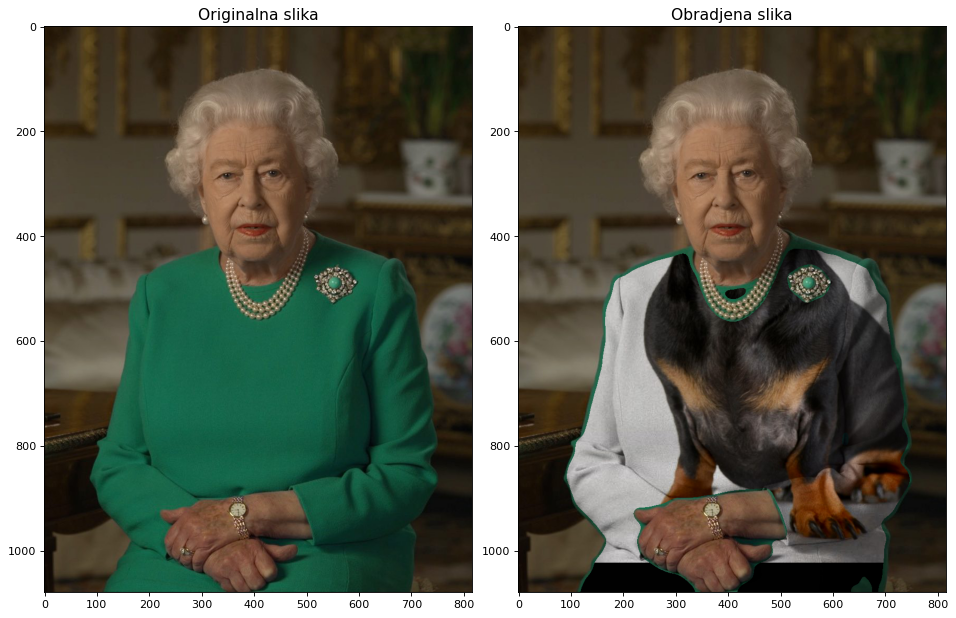

In [3]:
imgQueen = imread('../sekvence/queen_dress.jpg')
rgbImg = imread('jazavicar.jpg')

imgYUV = color.rgb2yuv(rgbImg)

imgOut = dressQueen(imgQueen, imgYUV)

fig, ax = plt.subplots(1, 2, figsize=(12,9), dpi=80);
tight_layout();
ax[0].imshow(imgQueen); ax[0].set_title('Originalna slika', fontsize=14);
ax[1].imshow(imgOut); ax[1].set_title('Obradjena slika', fontsize=14);


In [4]:
#filename = '../sekvence/queen_coat.mp4'

#vid = imageio.get_reader(filename,  'ffmpeg')
#video_out = imageio.get_writer(
 #   'queen_coat_out.mp4', format='FFMPEG', mode='I', fps=30, codec='h264')
    
#for cur_frame in vid:
 #   cur_frame = dressQueen(cur_frame, imgYUV)
  #  video_out.append_data(cur_frame)

#video_out.close()

Ovaj zadatak sam odradio tako što sam prvo prebacio u HSV kolor sistem i na osnovu boje i saturacije napravio masku. Takva maska hvata svo zelenilo u pozadini, zbog toga je potrebno isfiltrirati takvu dobijenu masku. Pošto mi maska ima samo True i False vrednosti pomnožio sam je sa vrednostima saturacije na slici, kako bih kasnije lakše mogao da odbacim delove sa manjom saturacijom. Nakon toga uradim Gausov filtar. Odsecanje mi zavisi od veličine slike, jer ne bi trebalo da bude isto odsecanje na slici i na videu, jer frame-ovi na videu su mnogo manji od slike kraljice. Nakon filtriranja slike uzmem samo vrednosti koji su veći od 0.7 x maksimalna saturacija. Pošto dobijam premalu masku, tada je proširim tako što još jednom pimenim Gausov filtar. Kada isfiltriram sliku uzmem samo vrednosti veće od 0.3 kako bih dobio što veću masku, a u isto vreme odsekao vrednosti koje ne spadaju u haljinu. U frame-ovima gde je zelenilo u pozadini i gde nema kraljice ima manje piksela koji prolaze kroz ceo ovaj proces tako da u frejmovima gde ima manje od 10000 takvih piksela vratim samo ulaznu sliku. Za frame-ove koji prođu sve ovo smatram da je kraljica tu i onda promenim u YUV kolor sistem. Pošto je osvetljenost na haljini drugačija na različitim mestima izdvajam Y komponentu sa maske i normalizujem je kako bih dobio osvetljenosti sa haljine i onda Y komponentu slike koju ubacujem umesto haljine množim sa normalizovanom Y komponentom sa haljine. U i V komponentu samo menjam na mestima haljine i tako dobijem izlaznu sliku.

## Zadatak 2

U drugom zadatku se tražilo da se izoštri slika. Za to sam koristio laplasijanov filtar. Korišćenjem laplasijana dobijamo razliku posmatranog piksela u odnosu na njegovu okolinu i na taj način se detektuju ivice. Kada detektujemo tu razliku trenutnog piksela u odnosu na njegovu okolinu onda tu razliku treba da oduzmemo od početnog piksela kako bismo dobili još veću razliku u odnosu na okolinu. Za laplasijanovu matricu sam koristio 3x3 matricu sa centrom jednakim -4, dok su dijagonalni elementi jednaki 0, a ostali 1. Pošto nam je Laplasijan matrica simetrična onda je svejedno da li radili korelaciju ili konvoluciju, ja sam radio korelaciju. Da matrica nije simetrična morala bi da se radi konvolucija.

In [5]:
from skimage import color
from skimage import *
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
from pylab import *
from scipy import ndimage

[[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


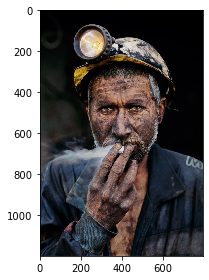

In [6]:
miner = imread('../sekvence/miner.jpg')
plt.figure()
io.imshow(miner)
# making laplacian matrix
laplacian = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
print(laplacian)

Kao što je traženo u zadatku prvo sam prebacio u YUV kolor sistem. Pošto obradu nastavljam samo nad Y komponentom prikazao sam Y komponentu pre obrade.

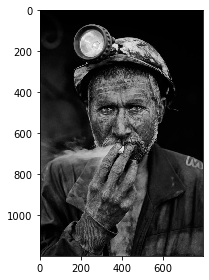

In [7]:
# switching to YUV color system
minerYUV = color.rgb2yuv(miner)
compY = minerYUV[:,:,0]
plt.figure()
io.imshow(compY, cmap='gray')

In [8]:
# filtering Y component of the image
filtratedCompY = ndimage.correlate(compY, laplacian)

In [9]:
# subtracting original Y component and filtrated Y component
minerYUV[:, :, 0] = compY - filtratedCompY
# limiting the result into the valid codomen
minerYUV[minerYUV[:,:,0]>1,0] = 1
minerYUV[minerYUV[:,:,0]<0,0] = 0

Nakon što sam isfiltrirao sliku morao sam da je ograničim na validan kodomen, s obzirom da se vrši oduzimanje moguće je da neki elementi odu ispod 0 ili iznad 1.

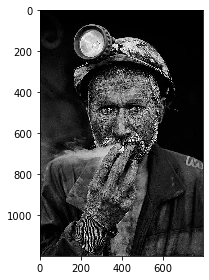

In [10]:
plt.figure()
io.imshow(minerYUV[:, :, 0], cmap='gray')

Ovo je rezultat izoštravanja na Y komponenti.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


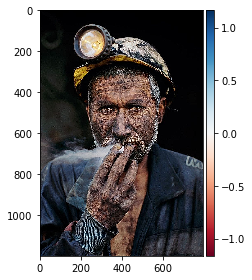

In [11]:
# switching back to RGB color system
minerOut = color.yuv2rgb(minerYUV)
plt.figure()
io.imshow(minerOut)

Kada vratimo nazad u RGB kolor sistem ovo je rezultat.

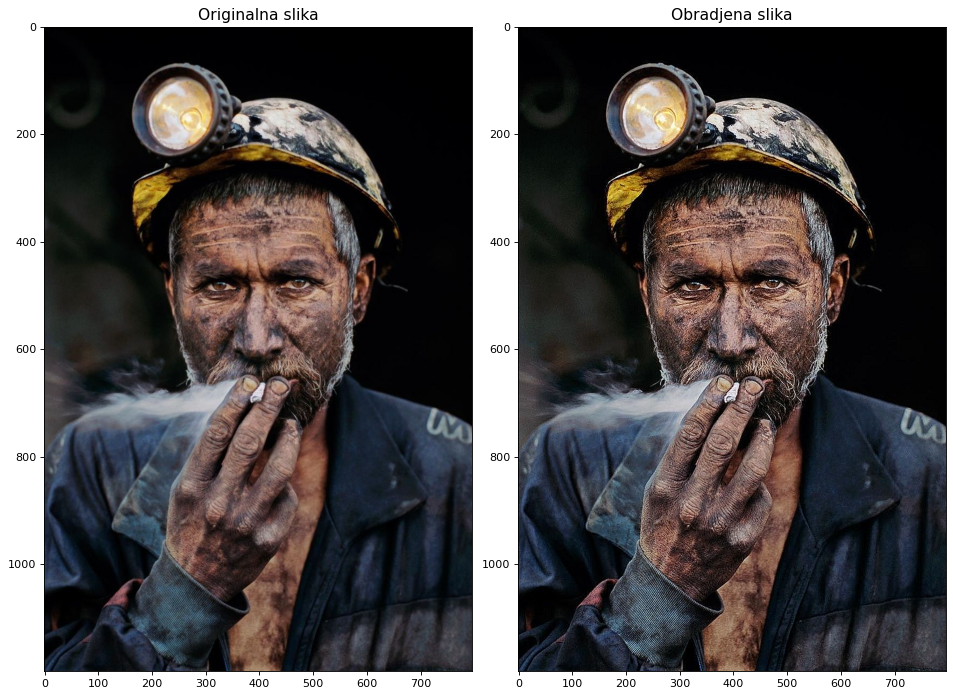

In [12]:
# limiting the result into the valid codomen
minerOut[minerOut>1] = 1
minerOut = img_as_ubyte(minerOut)

fig, ax = plt.subplots(1, 2, figsize=(12,9), dpi=80);
tight_layout();
ax[0].imshow(miner); ax[0].set_title('Originalna slika', fontsize=14);
ax[1].imshow(minerOut); ax[1].set_title('Obradjena slika', fontsize=14);
imsave('miner_sharp.jpg', minerOut)

I na kraju opet ograničavam da mi vrati na validan kodomen. I slika je sačuvana kao što je traženo u zadatku.

## Zadatak 3

U ovom zadatku je potrebno uraditi CLAHE obradu slike. CLAHE zahteva nekoliko koraka, a to su: podela slike na blokove, pravljenje histograma (funkciju gustinu verovatnoće) za svaki od blokova, ograničavanje histograma, pravljenje funkcije raspodele za svaki od blokova i određivanje intenziteta svakog piksela bilinearnom interpolacijom.

Radi preglednosti koda sve ove funkcionalnosti sam podelio u funkcije i spojio ih u jednu funkciju dosCLAHE. Funkcionalnosti određenih funkcija ću testirati na celoj sivoj slici, iako je slika deljena u blokove.

In [13]:
from pylab import *
import numpy as np
from skimage import color
from skimage import io
import matplotlib.pyplot as plt
import math
from skimage import *
import os
import time

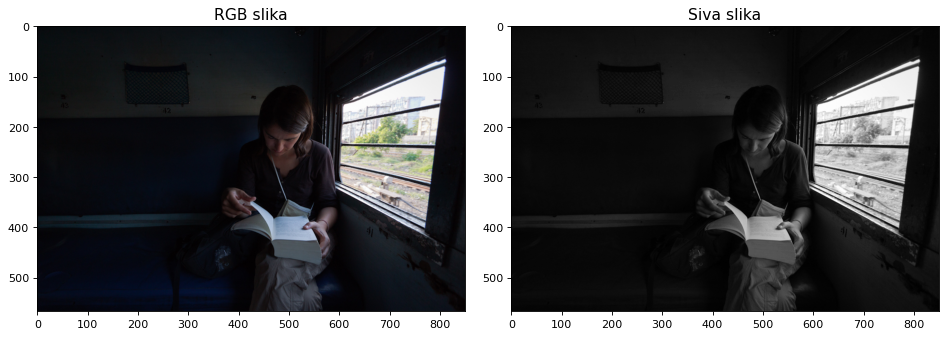

In [14]:
imgIn = imread('../sekvence/train.jpg')
imgGray = color.rgb2gray(imgIn)

imgGray = img_as_ubyte(imgGray)

fig, ax = plt.subplots(1, 2, figsize=(12,9), dpi=80);
tight_layout();
ax[0].imshow(imgIn); ax[0].set_title('RGB slika', fontsize=14);
ax[1].imshow(imgGray, cmap='gray'); ax[1].set_title('Siva slika', fontsize=14);

Prvo funkcija koja računa histogram.

In [15]:
def makeHist(imgIn: np.array) -> np.array:
    """

    Parameters
    ----------
    imgIn : np.array
        Input image.

    Returns
    -------
    np.array
        Histogram of the image.

    """
    numHist = np.zeros(256, dtype=int)
    for i in range(0, 256):
        # number of elements that are equal to i
        numHist[i] = np.sum(imgIn == i)
    # normalizing the histogram
    return numHist/imgIn.size

Text(0.5, 1.0, 'Histogram sive slike')

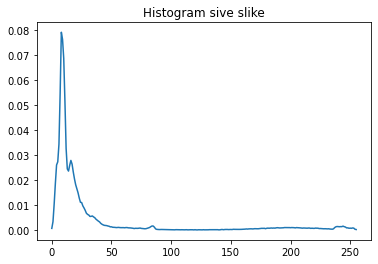

In [16]:
histGray = makeHist(imgGray)
plt.figure()
plt.plot(histGray)
plt.title("Histogram sive slike")

Ovo je histogram sive slike. Kao što vidimo ima pik na tamnom delu slike što nam govori da je slika dominantno tamna. Takođe vidimo da postoji mali broj svetlih piksela što pokazuje ovaj "pik" oko vrednosti 240. Zbog ovog velikog pika na tamnom delu slike očekujem veliki šum prilikom HE obrade slike, jer se mnogog mali interval (odokativno od 0 do 40) slika u skoro ceo kodomen. A pošto postoji ovaj "pik" oko 240 vrednosti očekujem da AHE ne daje dobre rezultate na svetlom delu slike, zbog toga je neophodno odraditi i limitiranje histograma i deljenje slike na blokove.

In [17]:
def makeT(histogram: np.array, limit: float) -> np.array:
    """


    Parameters
    ----------
    histogram : np.array
        Values of histogram.
    limit : float
        Limit for histogram.

    Returns
    -------
    T : np.array
        Returns the distribution function and limits the histogram.

    """
    # limiting the histogram
    T1 = np.sum(histogram[histogram > limit])-np.sum(histogram > limit)*limit
    histogram[histogram > limit] = limit
    histogram = histogram + T1/256
    # calculating the distribution function
    T = np.cumsum(histogram)
    # scaling the distribution function
    T = T*255
    return np.floor(T)

Ovo je funkcija koja limitira histogram i računa funkciju raspodele nakon limitiranja. Limitiranje histograma se radi da bismo dobili uniformniji histogram i na taj način usporili nagli rast funkcije raspodele. Težimo ka tome da nam histogram bude što više uniforman, ali ne želimo da preteramo u tome, jer ćemo izgubiti neke informacije sa slike. Nakon postavljanja velikih pikova na limit, moramo da dodamo razliku svim pikselima kako bi nam suma sa histograma ostala jednaka jedinici.

Text(0.5, 1.0, 'Histogram nakon limitiranja')

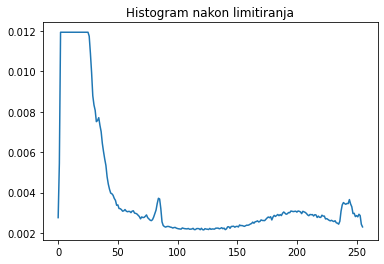

In [18]:
histogram = np.copy(histGray)
histogram1 = np.copy(histGray)
limit = 0.01
# limiting the histogram
T1 = np.sum(histogram[histogram > limit])-np.sum(histogram > limit)*limit
histogram[histogram > limit] = limit
histogram = histogram + T1/256
plt.figure()
plt.plot(histogram)
plt.title("Histogram nakon limitiranja")

Ovo je rezultat nakon limitiranja histograma. Kao što vidimo više nemamo toliko veliki pik.

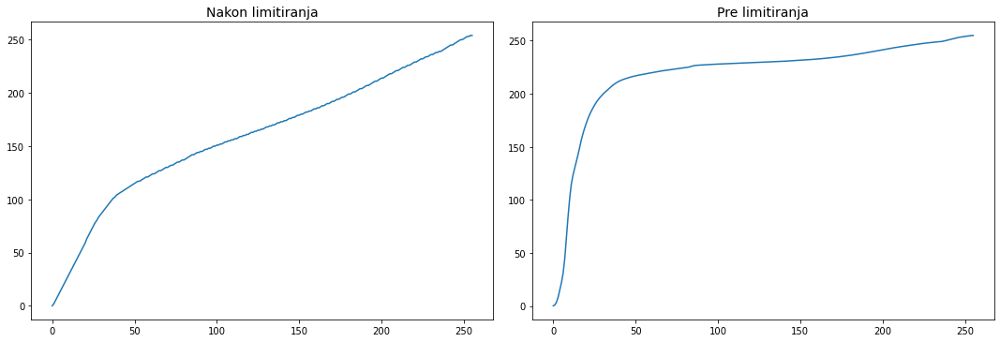

In [19]:
T = makeT(histGray, 0.01)
# calculating the distribution function
T1 = np.cumsum(histogram1)
# scaling the distribution function
T1 = T1*255
fig, ax = plt.subplots(1, 2, figsize=(15,5));
tight_layout();
ax[0].plot(T); ax[0].set_title('Nakon limitiranja', fontsize=14);
ax[1].plot(T1); ax[1].set_title('Pre limitiranja', fontsize=14);

Kao što vidimo limitiranje histograma je napravilo da dunkcija raspodele teži ka funkciji rampe, što je nama i bio cilj.

In [20]:
def makeMat(imgIn: np.array, sizeX: int, sizeY: int, i: int, j: int) -> np.array:
    """


    Parameters
    ----------
    imgIn : np.array
        Input image.
    sizeX : int
        Size of x coordinate of the tile.
    sizeY : int
        Size of y coordinate of the tile.
    i : int
        index.
    j : int
        index.
    Returns
    -------
    arr : np.array
        Returns the (i, j) piece of input image

    """
    if (i+1)*sizeX <= imgIn.shape[0] and (j+1)*sizeY <= imgIn.shape[1]:
        return imgIn[i*sizeX:(i+1)*sizeX, j*sizeY:(j+1)*sizeY]
    if (i+1)*sizeX > imgIn.shape[0] and (j+1)*sizeY <= imgIn.shape[1]:
        mat = imgIn[i*sizeX:, j*sizeY:(j+1)*sizeY]
        con = imgIn[imgIn.shape[0]-(i+1)*sizeX:, j*sizeY:(j+1)*sizeY]
        return np.concatenate((mat, con), axis=0)
    if (i+1)*sizeX <= imgIn.shape[0] and (j+1)*sizeY > imgIn.shape[1]:
        mat = imgIn[i*sizeX:(i+1)*sizeX, j*sizeY:]
        con = imgIn[i*sizeX:(i+1)*sizeX, imgIn.shape[1]-(j+1)*sizeY:]
        return np.concatenate((mat, con), axis=1)
    mat = imgIn[i*sizeX:, j*sizeY:]
    con1 = imgIn[i*sizeX:, imgIn.shape[1]-(j+1)*sizeY:]
    mat = np.concatenate((mat, con1), axis=1)
    con2 = mat[imgIn.shape[0]-(i+1)*sizeX:, :]
    return np.concatenate((mat, con2), axis=0)

Ovo je funkcija koja deli sliku na blokove. Pošto se dešava da se poslednji blokovi ne popune do kraja, onda sam na te blokove dodavao poslednje redove i kolone tako da ih popunim do kraja.

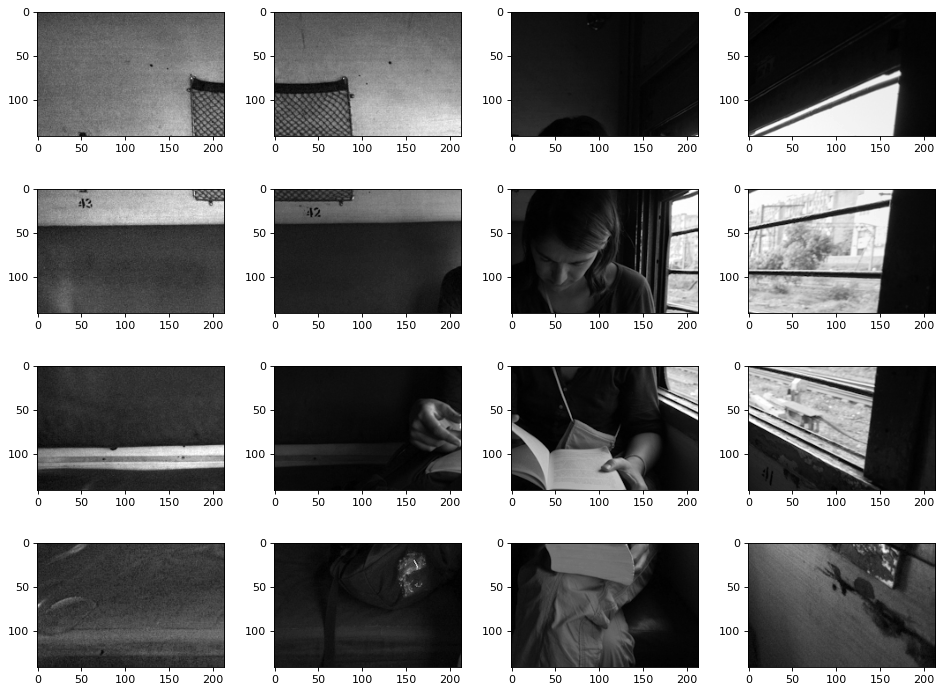

In [21]:
numTiles = [4, 4]

sizeX = math.ceil(imgIn.shape[0]/numTiles[0])
sizeY = math.ceil(imgIn.shape[1]/numTiles[1])

fig, ax = plt.subplots(numTiles[0], numTiles[1], figsize=(12,9), dpi=80);
tight_layout();
for i in range(numTiles[0]):
    for j in range(numTiles[1]):
        img = makeMat(imgGray, sizeX, sizeY, i, j)
        ax[i, j].imshow(img, cmap='gray');

In [22]:
def sgn(x: int) -> int:
    """


    Parameters
    ----------
    x : int
        Value.

    Returns
    -------
    int
        Sign of x, sign does not important if x is zero.

    """
    if (x < 0):
        return -1
    return 1

Za bilinearnu interpolaciju mi je potrebna funkcija sgn, koju nisam uspeo da nađem među ugrađenim funkcijama, pa sam napisao svoju.

In [23]:
def bilinearInterpolation(imgIn: np.array, T: np.array, sizeX: int, sizeY: int, numTiles: []) -> np.array:
    """


    Parameters
    ----------
    imgIn : np.array
        Input gray-scale image.
    T : np.array
        Matrix of distribution functions for each tile.
    sizeX : int
        Number of pixcels in x coordinate for each tile.
    sizeY : int
        Number of pixcels in y coordinate for each tile.
    numTiles : []
        Number of tiles.

    Returns
    -------
    imgOut : np.array
        Calculates values of each pixcel using bilinear interpolation.

    """
    imgOut = np.zeros(imgIn.shape, dtype=uint8)
    # calculating bilinear interpolation for every pixcel
    for i in range(imgIn.shape[0]):
        for j in range(imgIn.shape[1]):
            # finding in which tile is pixcel
            blockX = math.floor(i/sizeX)
            blockY = math.floor(j/sizeY)
            # finding the center of the tile
            centerX = sizeX/2 + blockX*sizeX
            centerY = sizeY/2 + blockY*sizeY
            # finding other tiles for bilinear interpolation
            pomX = sgn(i-centerX)
            pomY = sgn(j-centerY)
            # finding the weights a and b
            a = abs(i-centerX)
            b = abs(i-(centerX+pomX*sizeX))

            x1 = 0
            x2 = 0
            x3 = 0
            # if these tiles are out of the image, some weights are equal to 0
            if blockX+pomX < 0 or (blockX+pomX) >= numTiles[0]:
                a = 0
            else:
                x1 = T[blockX+pomX, blockY, imgIn[i, j]]

            if blockY+pomY >= 0 and (blockY+pomY) < numTiles[1]:
                x2 = T[blockX, blockY+pomY, imgIn[i, j]]
                if blockX+pomX >= 0 and (blockX+pomX) < numTiles[0]:
                    x3 = T[blockX+pomX, blockY+pomY, imgIn[i, j]]

            c = abs(j-centerY)
            d = abs(j-(centerY+pomY*sizeY))

            if blockY+pomY < 0 or (blockY+pomY) >= numTiles[1]:
                c = 0
            # calculating the r, g and b component of the auxiliary pixcels
            sh1 = (T[blockX, blockY, imgIn[i, j]]*b + x1*a)/(a+b)
            sh2 = (x2*b+x3*a)/(a+b)
            # caluclating the output pixcel
            imgOut[i, j] = np.round((sh1*d+sh2*c)/(c+d))

    return imgOut

Pošto nisam siguran kako da testiram bilinearnu interpolaciju bez ostalih funkcija, bilinearnu interpolaciju neću testirati. Rezultati koje budem dobio će pokazati da li je interpolacija dobra ili nije.

In [24]:
def dosCLAHE(imgIn: np.array, numTiles: [] = [8, 8], limit: float = 0.01) -> np.array:
    """


    Parameters
    ----------
    imgIn : np.array
        Input image.
    numTiles : [], optional
        Number of tiles. The default is [8, 8].
    limit : float, optional
        Clip limit for histogram values. The default is 0.01.

    Returns
    -------
    TYPE
        Returns tha image processed by CLAHE algorithm.

    """
    # calculating the size of each tile
    sizeX = math.ceil(imgIn.shape[0]/numTiles[0])
    sizeY = math.ceil(imgIn.shape[1]/numTiles[1])
    # exceptions
    if limit < 0:
        print("Greska sa limitom.")
        return

    if len(numTiles) > 2 or numTiles[0] <= 0 or numTiles[1] <= 0 or type(numTiles[0]) is not int or type(numTiles[1]) is not int:
        print("Greska sa blokovima.")
        return

    # enters the if if the image is rgb, otherwise it is gray scale
    if len(imgIn.shape) == 3:
        # switching to YUV color system
        imgInYUV = color.rgb2yuv(imgIn)
        imgInY = img_as_ubyte((imgInYUV[:, :, 0]))
        T = np.zeros([numTiles[0], numTiles[1], 256])
        # calculate the histogram and distribution function for each tile
        for i in range(numTiles[0]):
            for j in range(numTiles[1]):
                mat = makeMat(imgInY, sizeX, sizeY, i, j)
                histogram = makeHist(mat)
                T[i, j, :] = makeT(histogram, limit)

        imgOutY = bilinearInterpolation(imgInY, T, sizeX, sizeY, numTiles)
        imgInYUV[:, :, 0] = img_as_float(imgOutY)
        
        # switching back to RGB color system
        imgOut = color.yuv2rgb(imgInYUV)
        imgOut[imgOut < 0] = 0
        imgOut[imgOut > 1] = 1
        return imgOut
    else:
        T = np.zeros([numTiles[0], numTiles[1], 256])
        # calculate the histogram and distribution function for each tile
        for i in range(numTiles[0]):
            for j in range(numTiles[1]):
                mat = makeMat(imgIn, sizeX, sizeY, i, j)
                histogram = makeHist(mat)
                T[i, j, :] = makeT(histogram, limit)
        return bilinearInterpolation(imgIn, T, sizeX, sizeY, numTiles)

Ovo je funkcija koja spaja sve one prethodne funkcionalnosti. Kada radim obradu RGB slike, prvo prebacim na YUV kolor sistem i radim obradu nad Y komponentom slike. 
Prvo ću testirati HE algoritam i videti kako se on ponaša na slici. Za to mi je potreban limit=1 i da ne delim sliku na blokove.

In [25]:
def start(Tiles :[] = [8, 8], limit : float =0.01) -> None:
    # CLAHE for RGB image
    startTime = time.time()
    imgOut = dosCLAHE(imgIn, Tiles, limit)
    endTime = time.time()
    executionTime = endTime - startTime

    fig, ax = plt.subplots(2, 2, figsize=(12,9), dpi=80);
    tight_layout();
    # ploting RGB image
    if type(imgOut) is np.ndarray:
        ax[0, 0].imshow(imgOut); ax[0, 0].set_title('dosCLAHE', fontsize=14);
    print("Vreme izvrsavanja za RGB sliku: " + str(round(executionTime, 3)) + "s \n")
    executionTimeNorm = executionTime/np.size(imgGray)
    print("Vreme izvrsavanja za RGB: " + str(round(executionTimeNorm*1e6,3))+ "us/pix \n")

    # CLAHE for gray image
    startTime = time.time()
    imgGrayOut = dosCLAHE(img_as_ubyte(imgGray),Tiles,limit)
    endTime = time.time()
    executionTime = endTime - startTime

    # ploting gray image
    if type(imgGrayOut) is np.ndarray:
        ax[0, 1].imshow(imgGrayOut, cmap='gray'); ax[0, 1].set_title('dosCLAHE', fontsize=14);
    print("Vreme izvrsavanja za sivu sliku: " + str(round(executionTime, 3)) + "s \n")
    executionTimeNorm = executionTime/np.size(imgGray)
    print("Vreme izvrsavanja za sivu sliku:"  + str(round(executionTimeNorm*1e6,3))+ " us/pix \n")


    # CLAHE for RGB image, library function
    imgInYUV = color.rgb2yuv(imgIn)
    startTime = time.time()
    imgFakeCLAHE = exposure.equalize_adapthist(imgInYUV[:, :, 0], [
                                               imgIn.shape[0]/Tiles[0], imgIn.shape[1]/Tiles[1]], clip_limit=limit, nbins=256)
    endTime = time.time()
    executionTime = endTime - startTime
    print("Vreme izvrsavanja za RGB sliku (ugradjena funkcija): " + str(round(executionTime, 3)) + "s \n")
    executionTimeNorm = executionTime/np.size(imgGray)
    print("Vreme izvrsavanja za RGB sliku(ugradjena funkcija): " + str(round(executionTimeNorm*1e6,3))+  "us/pix \n")
    
    imgInYUV[:, :, 0] = imgFakeCLAHE
    imgFakeCLAHE = color.yuv2rgb(imgInYUV)
    imgFakeCLAHE[imgFakeCLAHE > 1] = 1
    imgFakeCLAHE[imgFakeCLAHE < 0] = 0

    ax[1, 0].imshow(imgFakeCLAHE); ax[1, 0].set_title('Ugradjena funkcija', fontsize=14);

    startTime = time.time()
    imgGrayFakeCLAHE = exposure.equalize_adapthist(imgGray, [
                                               imgIn.shape[0]/Tiles[0], imgIn.shape[1]/Tiles[1]], clip_limit=limit, nbins=256)
    endTime = time.time()
    executionTime = endTime - startTime
    print("Vreme izvrsavanja za sivu sliku (ugradjena funkcija): " + str(round(executionTime, 3)) + "s \n")
    executionTimeNorm = executionTime/np.size(imgGray)
    print("Vreme izvrsavanja za sivu sliku (ugradjena funkcija): " + str(round(executionTimeNorm*1e6,3))+  "us/pix \n")
    
    imgFakeCLAHE[imgFakeCLAHE > 1] = 1
    imgFakeCLAHE[imgFakeCLAHE < 0] = 0

    ax[1, 1].imshow(imgGrayFakeCLAHE, cmap='gray'); ax[1, 1].set_title('Ugradjena funkcija', fontsize=14);

Vreme izvrsavanja za RGB sliku: 5.331s 

Vreme izvrsavanja za RGB: 11.061us/pix 

Vreme izvrsavanja za sivu sliku: 4.741s 

Vreme izvrsavanja za sivu sliku:9.838 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.367s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.762us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.323s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.671us/pix 



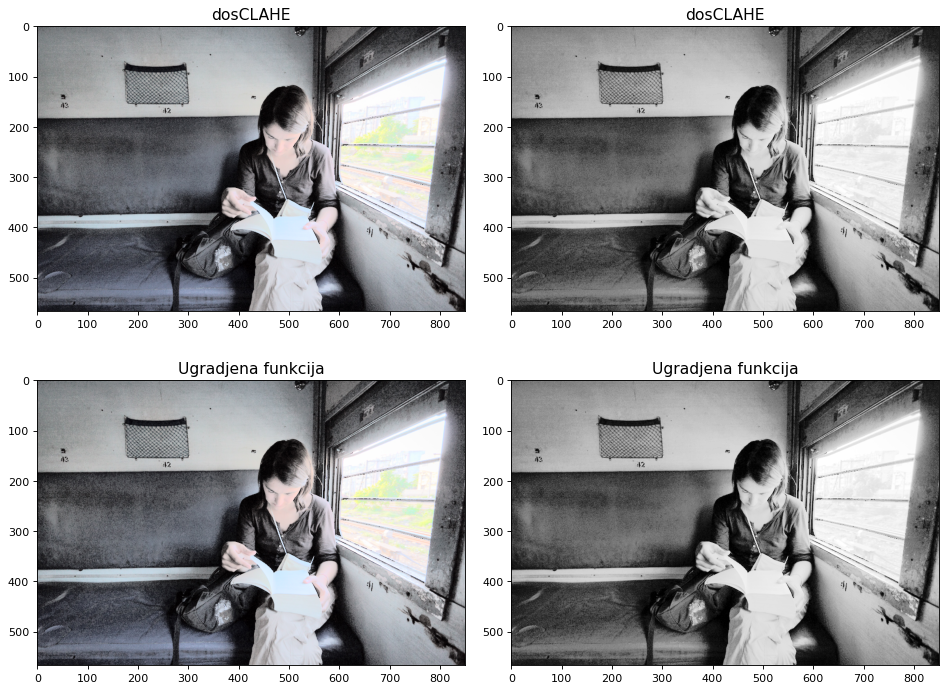

In [26]:
start([1,1], 1)

Kao što vidimo HE algoritam nije dao dobre rezultate, kao što sam i ranije rekao mnogo mali interval se slika u skoro ceo domen i rezultat je šum. Na početku sam isplotovao histogram gde sam pokazao da je maksimalna vrednost na histogramu manja od 0.1, zbog toga ako stavimo da je limit 0.1 trebalo bi da dobijemo iste rezultate.

Vreme izvrsavanja za RGB sliku: 5.647s 

Vreme izvrsavanja za RGB: 11.718us/pix 

Vreme izvrsavanja za sivu sliku: 4.881s 

Vreme izvrsavanja za sivu sliku:10.127 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.348s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.722us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.323s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.671us/pix 



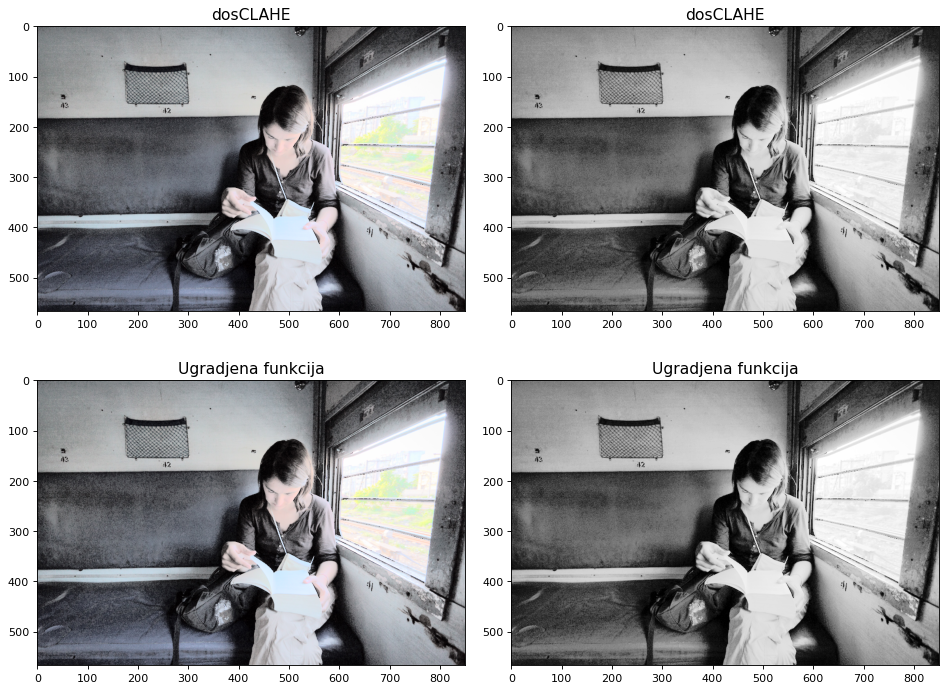

In [27]:
start([1,1],0.1)

Sada proveravamo CLHE algoritam za vrednost limit=0.01

Vreme izvrsavanja za RGB sliku: 4.826s 

Vreme izvrsavanja za RGB: 10.013us/pix 

Vreme izvrsavanja za sivu sliku: 5.244s 

Vreme izvrsavanja za sivu sliku:10.881 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.381s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.79us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.326s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.676us/pix 



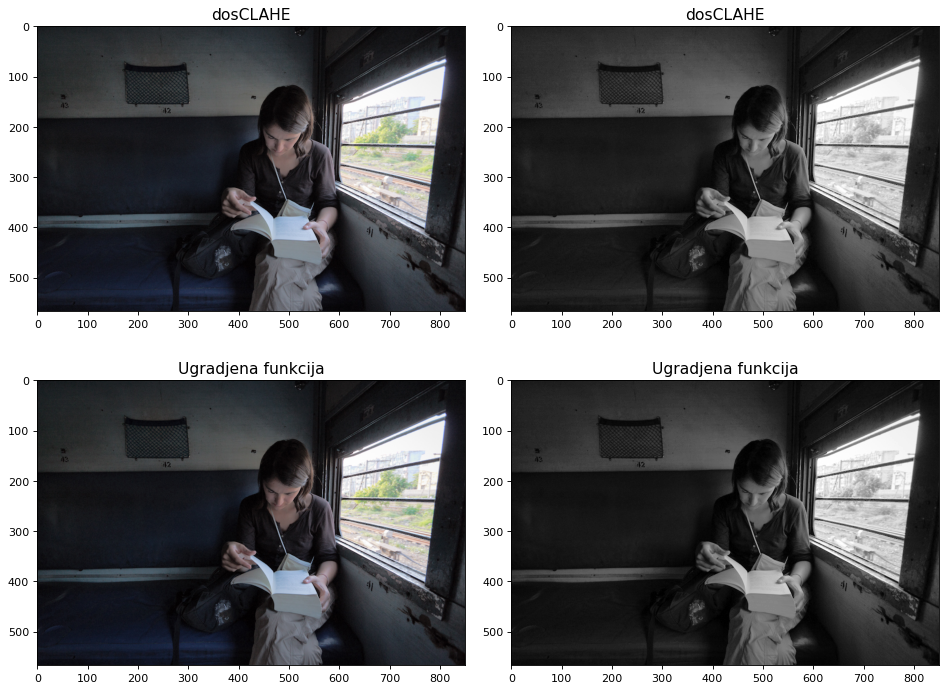

In [28]:
start([1,1],0.01)

Sada smo se otarasili šuma, ali imamo problem jer nam je na prozoru još više prosvetljena slika. Zbog toga bi nam CLAHE više odgovarao u ovom slučaju.

Vreme izvrsavanja za RGB sliku: 5.08s 

Vreme izvrsavanja za RGB: 10.541us/pix 

Vreme izvrsavanja za sivu sliku: 5.054s 

Vreme izvrsavanja za sivu sliku:10.488 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.491s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 1.02us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.497s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 1.031us/pix 



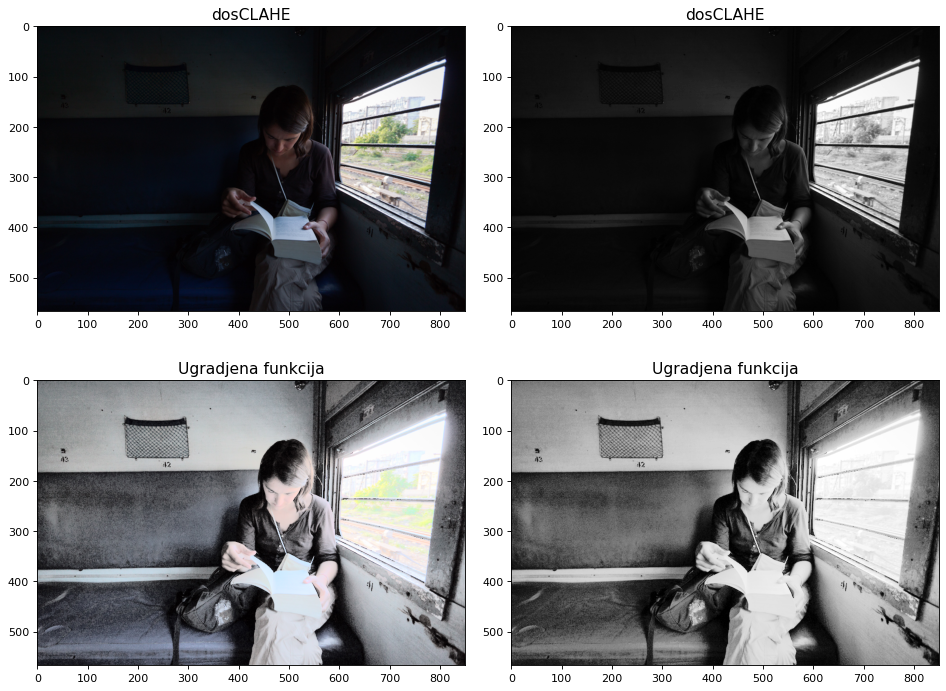

In [29]:
start([1,1],0)

Kada stavimo limit na 0, nismo odradili ništa. Razlog tome je što nam histogram postaje strogo uniforman i izgubili smo sve informacije sa slike. Funkcija raspodele nam postaje rampa i onda se sve vrednosti slikaju same u sebe. Zbog toga više neću testirati za vrednost limita=0. Što se tiče ugrađene funkcije, ona vraća isti rezultat kao kada je limit=1, verovatno jer u sebi ima uslov da limit mora da bude veći od 0 i manji ili jednak 1, ukoliko ne ispuni taj uslov vraća limit na 1.

Sada da vidimo kakve rezultate daje AHE.

Vreme izvrsavanja za RGB sliku: 7.215s 

Vreme izvrsavanja za RGB: 14.97us/pix 

Vreme izvrsavanja za sivu sliku: 7.352s 

Vreme izvrsavanja za sivu sliku:15.254 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.232s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.482us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.256s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.531us/pix 



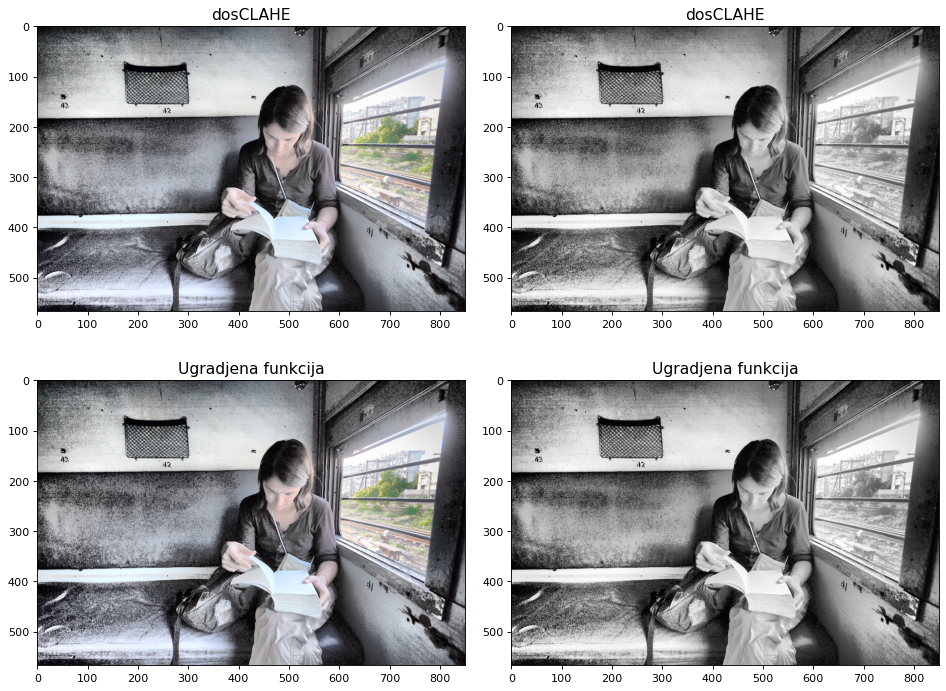

In [30]:
start([4,4],1)

Kao što vidimo loše rezultate na tamnom delu slike. Na tim delovima slike histogram ima verovatno još veći pik na tamnom delu slike nego onaj histogram sa početka za celu sliku.

Vreme izvrsavanja za RGB sliku: 6.84s 

Vreme izvrsavanja za RGB: 14.193us/pix 

Vreme izvrsavanja za sivu sliku: 6.931s 

Vreme izvrsavanja za sivu sliku:14.38 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.192s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.399us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.143s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.297us/pix 



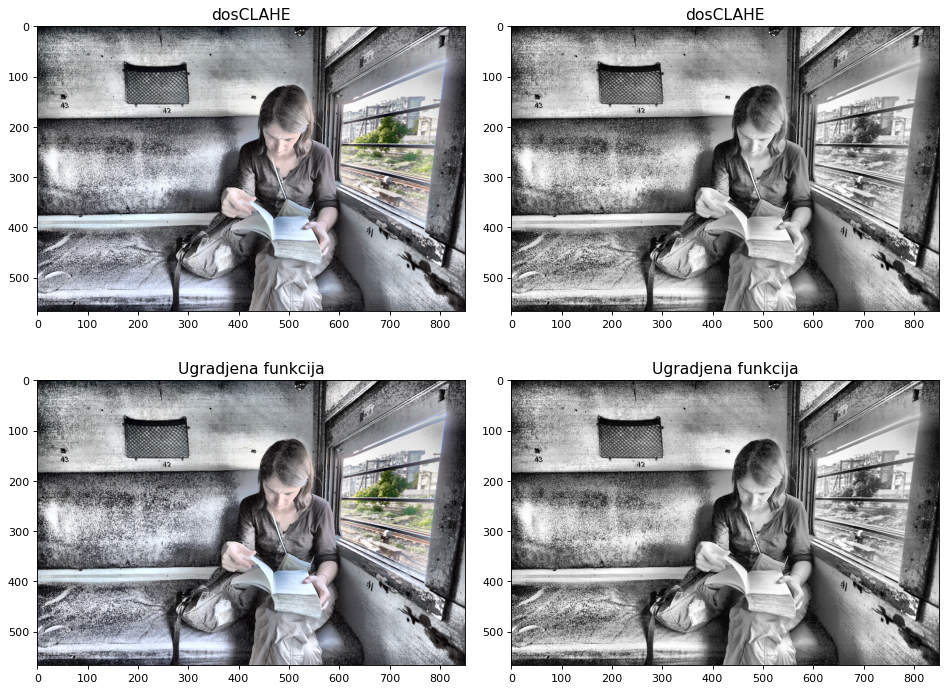

In [31]:
start([8,8],1)

Povećavanjem broja blokova dobijamo još veću separaciju tamnog i svetlog dela slike, pa dobijamo još veći šum. Pošto su blokovi dovoljno mali sada se šum pojavljuje i blizu svetlog dela slike.

Vreme izvrsavanja za RGB sliku: 7.373s 

Vreme izvrsavanja za RGB: 15.298us/pix 

Vreme izvrsavanja za sivu sliku: 7.067s 

Vreme izvrsavanja za sivu sliku:14.664 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.193s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.4us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.146s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.302us/pix 



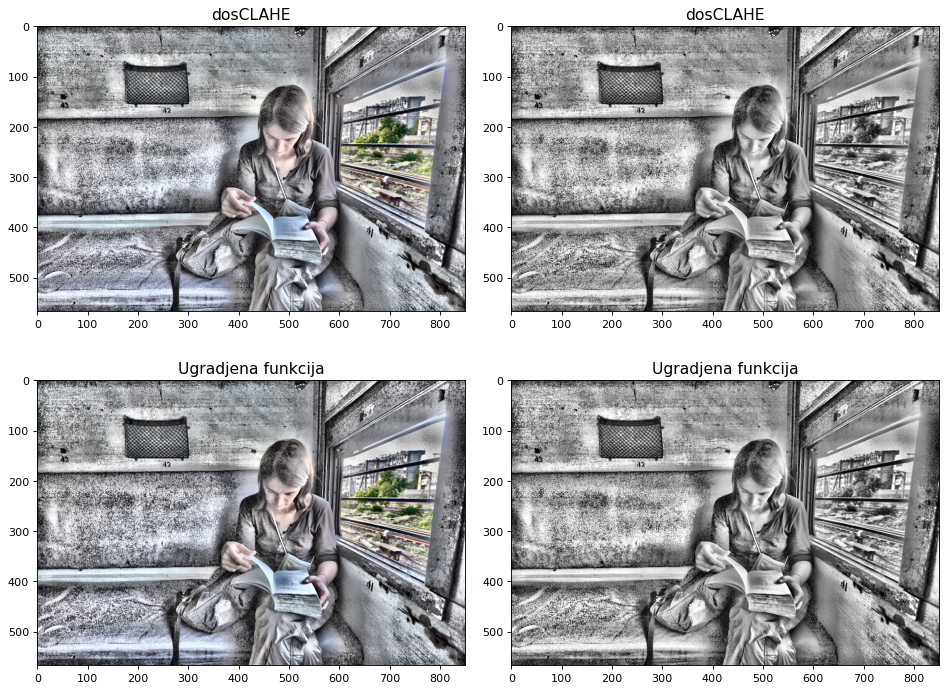

In [32]:
start([16,16],1)

Dobijamo još veći šum jer su blokovi još manji.

Vreme izvrsavanja za RGB sliku: 6.211s 

Vreme izvrsavanja za RGB: 12.887us/pix 

Vreme izvrsavanja za sivu sliku: 6.154s 

Vreme izvrsavanja za sivu sliku:12.769 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.239s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.496us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.201s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.416us/pix 



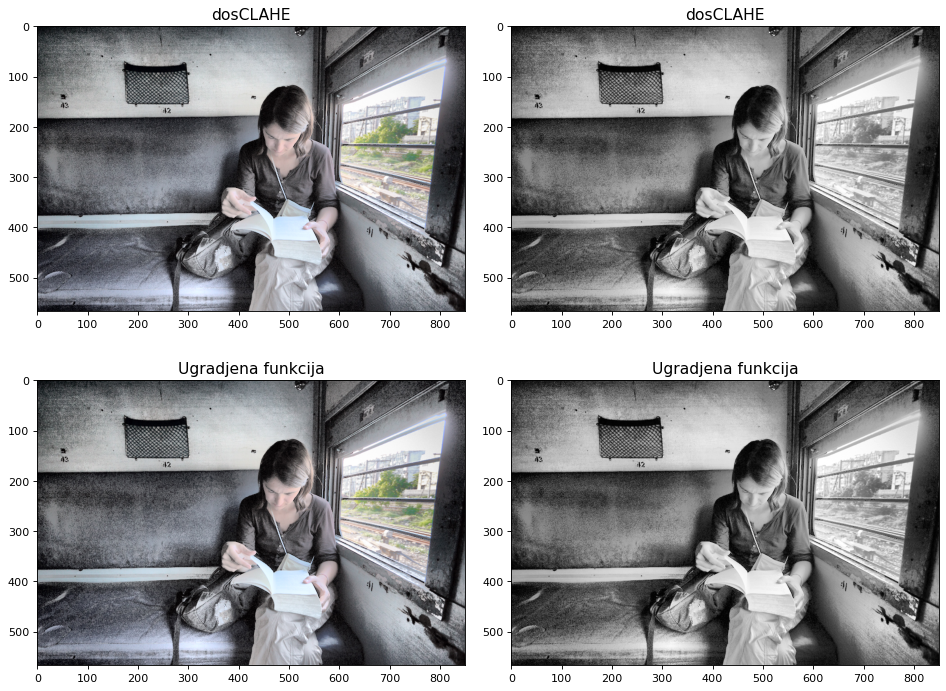

In [33]:
start([4,4],0.1)

Sada stavljanjem limita na 0.1 ima nekog smisla, iako idalje imamo šum. Sada pošto imamo i tamnije blokove, histogrami u tim blokovima imaju pik preko 0.1. Taj limit iako limitira deo histograma nije dovoljno mali da bismo izbegli šum.

Vreme izvrsavanja za RGB sliku: 7.728s 

Vreme izvrsavanja za RGB: 16.034us/pix 

Vreme izvrsavanja za sivu sliku: 7.271s 

Vreme izvrsavanja za sivu sliku:15.086 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.202s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.419us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.142s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.294us/pix 



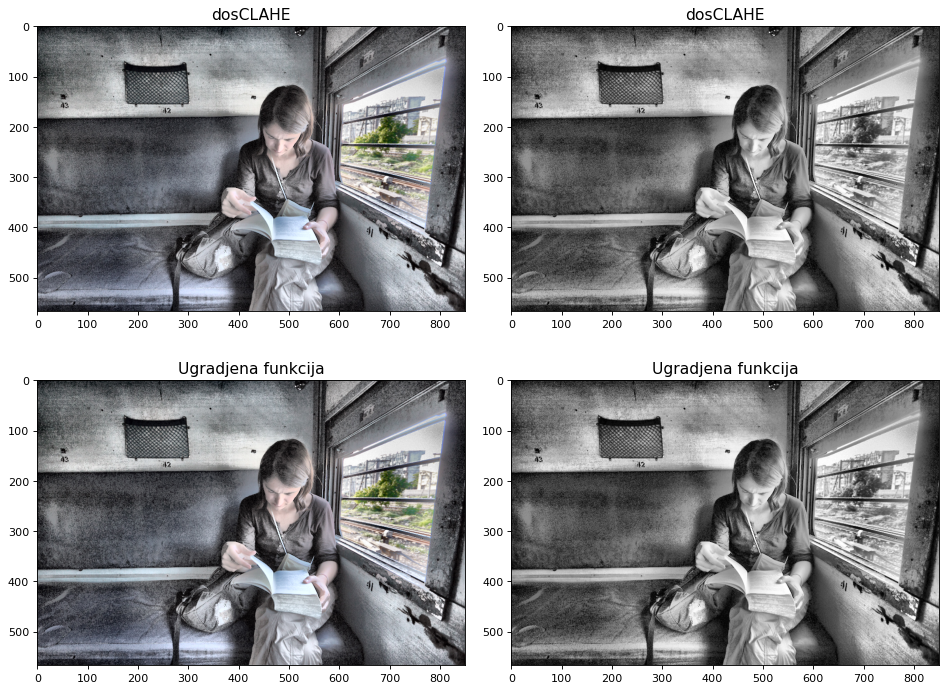

In [34]:
start([8,8],0.1)

Kako povećavamo broj blokova tako nam se šum širi jer svetliji deo slike ima manji uticaj na tamniji jer je dalje.

Vreme izvrsavanja za RGB sliku: 8.645s 

Vreme izvrsavanja za RGB: 17.937us/pix 

Vreme izvrsavanja za sivu sliku: 7.68s 

Vreme izvrsavanja za sivu sliku:15.935 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.263s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.546us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.193s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.401us/pix 



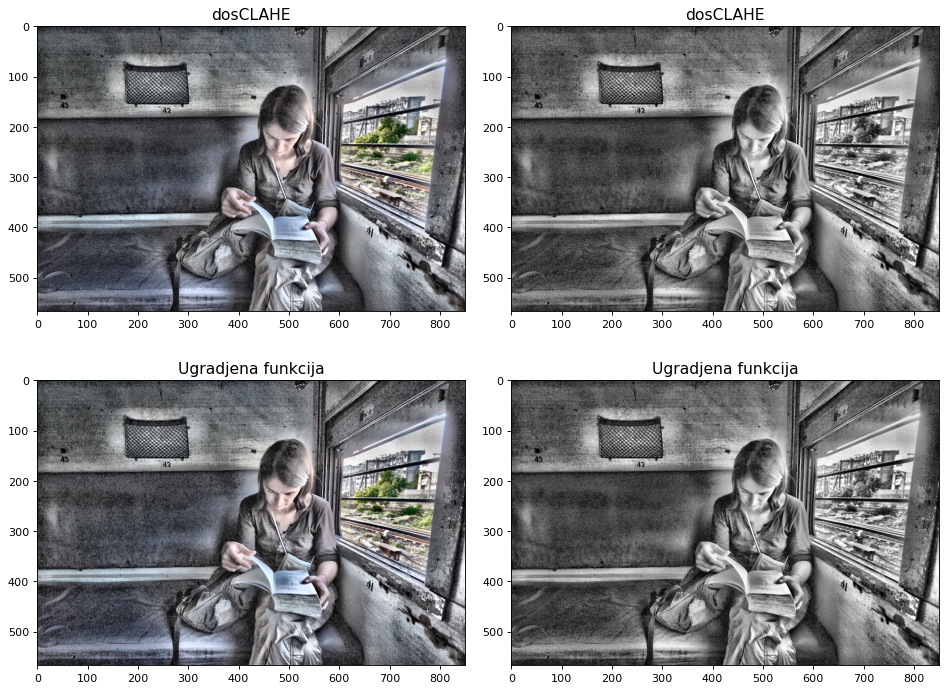

In [35]:
start([16,16],0.1)

Isti trend važi i za još veće povećanje broja blokova.

Sada prelazimo na limit=0.01. 

Vreme izvrsavanja za RGB sliku: 6.506s 

Vreme izvrsavanja za RGB: 13.499us/pix 

Vreme izvrsavanja za sivu sliku: 5.973s 

Vreme izvrsavanja za sivu sliku:12.393 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.228s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.472us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.193s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.401us/pix 



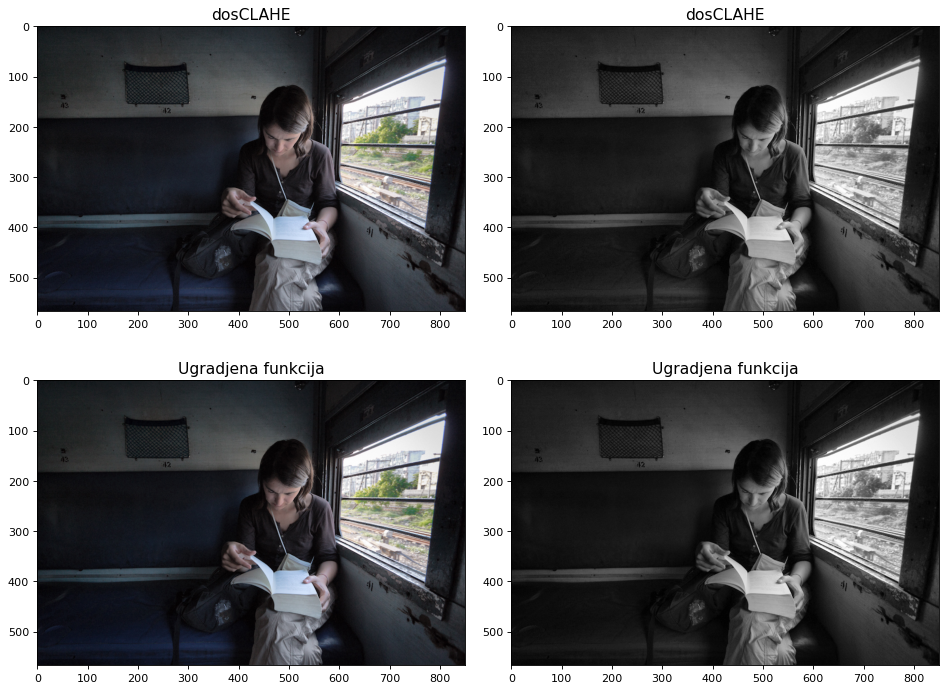

In [36]:
start([4,4],0.01)

I za mali broj blokova dobijamo solidne rezultate. Taman deo slike se prosvetlio, a svetliji se protamnio.

Vreme izvrsavanja za RGB sliku: 6.41s 

Vreme izvrsavanja za RGB: 13.3us/pix 

Vreme izvrsavanja za sivu sliku: 7.535s 

Vreme izvrsavanja za sivu sliku:15.634 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.209s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.433us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.157s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.326us/pix 



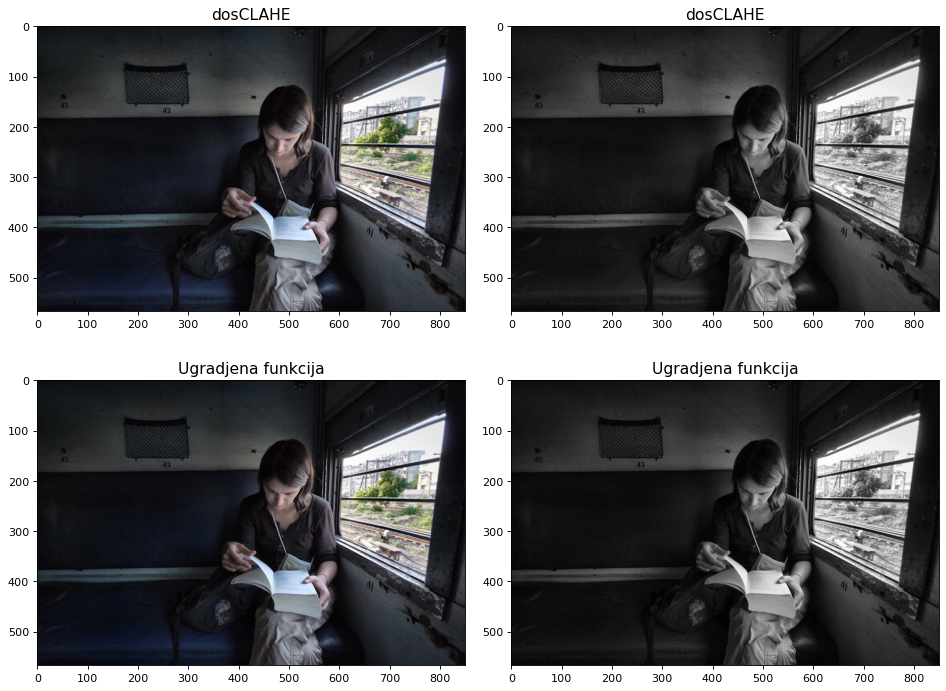

In [37]:
start([8,8],0.01)

Sada dobijamo odlične rezultate.

Vreme izvrsavanja za RGB sliku: 8.006s 

Vreme izvrsavanja za RGB: 16.612us/pix 

Vreme izvrsavanja za sivu sliku: 7.024s 

Vreme izvrsavanja za sivu sliku:14.573 us/pix 

Vreme izvrsavanja za RGB sliku (ugradjena funkcija): 0.257s 

Vreme izvrsavanja za RGB sliku(ugradjena funkcija): 0.533us/pix 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.191s 

Vreme izvrsavanja za sivu sliku (ugradjena funkcija): 0.397us/pix 



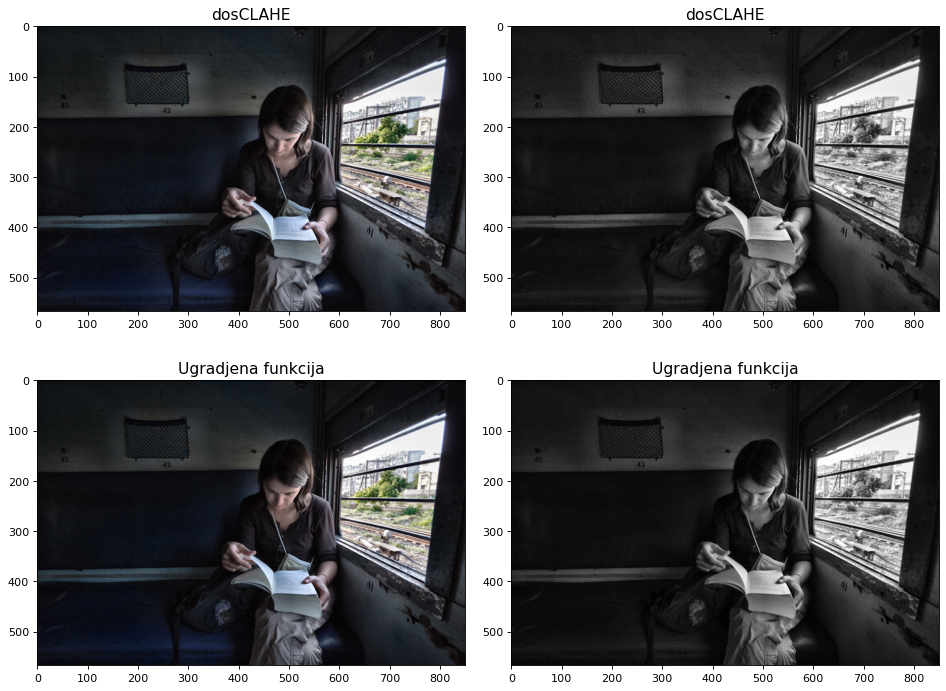

In [38]:
start([16,16],0.01)

Povećanjem broja blokova sada postižemo još bolje rezultate. Tamniji deo postaje svetliji.

Rezultati moje funkcije i ugrađene funkcije su slični. Vidi se mala razlika, pretpostavljam da je u pitanju drugačija interpolacija ili neka optimizacija boja.